<a href="https://colab.research.google.com/github/pzwiernik/22997-networks/blob/main/colabs/seminar5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Sampling with and without replacement

The Python module Random has function `random.choices`and `random.sample` that can be used for sampling from a given population. Note the difference: `random.choices` samples with replacement (observations can repeat) and `random.sample` samples without replacement (no repetitions).

In [17]:
import random

# define the population
population = ['A', 'B', 'C', 'D', 'E']

# sample 4 elements with replacement
print("With replacement:", random.choices(population,k=4))

# sample 4 distinct elements (without replacement)
print("Without replacement:", random.sample(population, k=4))


With replacement: ['A', 'D', 'A', 'D']
Without replacement: ['D', 'C', 'B', 'A']


The configuration model uses sampling without replacement and for preferential attachment we use sampling with replacement. Note also that in preferential attachment we do not sample uniformly but with probability that is proportional to degrees. The function `random.choices` allows to sample from non-uniform distribution induced by some weights (e.g. the degrees). Let's look at some examples by changing `weights`.

In [88]:
weights = [1,0,0,0,0]
print("With replacement:", random.choices(population,weights,k=10))


With replacement: ['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


# Configuration model

Consider the degree sequence (2,2,3,2,1). We sample from the corresponding configuration model. We have $2L=10$ stubs, which we label A1,A2,B1,B2,C1,C2,C3,D1,D2,E1. One way to pair then randomly (which induces a uniform distribution over all pairings) is to follow the following procedure:
- pick a stub uniformly at random from the given $2L$ stubs
- pick another stub uniformly from the remaining $2L-1$ stubs
- pair them and discard from the list, we are left with $2L-2$ stubs
- pick a stub uniformly from the remaining list
- pick another one from the remaining $2L-3$, pair them and repeat.

We could do it step by step or use a "trick".

In [44]:
stubs = ['A1','A2','B1','B2','C1','C2','C3','D1','D2','E1']
print("Without replacement:", random.sample(stubs, k=len(stubs)))

Without replacement: ['A1', 'B1', 'C2', 'D2', 'C3', 'D1', 'B2', 'A2', 'E1', 'C1']


NetworkX also has a built function to sample from the configuration model

Is simple: True


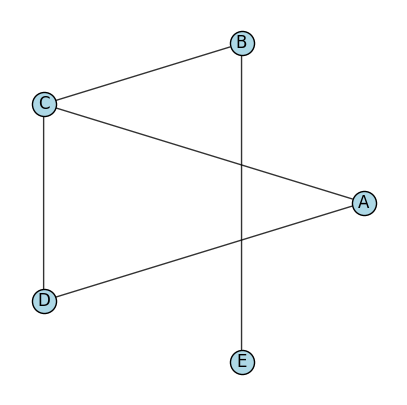

In [67]:
import networkx as nx
import matplotlib.pyplot as plt

# degree sequence
deg = [2, 2, 3, 2, 1]

# configuration model (creates a MultiGraph)
G = nx.configuration_model(deg)

# relabel nodes A,B,C,D,E
mapping = {i: chr(65 + i) for i in range(len(deg))}
G = nx.relabel_nodes(G, mapping)

# check simplicity
is_simple = nx.number_of_selfloops(G) == 0 and all(G.number_of_edges(u, v) == 1 for u, v in G.edges())
print("Is simple:", is_simple)

# layout
pos = nx.circular_layout(G)
plt.figure(figsize=(5, 5))
nx.draw_networkx_nodes(G, pos, node_color="lightblue", edgecolors="black")
nx.draw_networkx_labels(G, pos)

# --- draw edges manually, offsetting multiedges ---
# group all edges ignoring keys
edge_counts = {}
for u, v, _ in G.edges(keys=True):
    if u == v:
        continue  # loops drawn later
    edge_counts[frozenset((u, v))] = edge_counts.get(frozenset((u, v)), 0) + 1

# draw curved edges for multi-edges
for (u, v), count in edge_counts.items():
    # if multiple edges, spread them symmetrically around 0
    if count == 1:
        nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], connectionstyle="arc3,rad=0", alpha=0.8)
    else:
        for i, offset in enumerate(range(-(count - 1), count, 2)):
            rad = 0.2 * offset
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], connectionstyle=f"arc3,rad={rad}", alpha=0.8)
        # label edge multiplicity at midpoint
        mid_x = (pos[u][0] + pos[v][0]) / 2
        mid_y = (pos[u][1] + pos[v][1]) / 2
        plt.text(mid_x, mid_y + 0.1, f"{count}×", color="red", fontsize=10, ha="center")

# draw loops separately
loops = [(u, v) for u, v in G.edges() if u == v]
nx.draw_networkx_edges(G, pos, edgelist=loops, connectionstyle="arc3,rad=0.3", edge_color="orange", alpha=0.8)

plt.axis("off")
plt.show()

# Preferential attachment

We first generate a couple of steps of the preferential attachment model for $m=2$. Start with teh edge A-B. When C comes, it attaches to both forming eth triangle. When D comes, it attaches to two nodes uniformly. The following code will be useful.

In [70]:
print("D attaches to:", random.choices(['A','B','C'],weights=[2,2,2],k=2))

D attaches to: ['B', 'A']


In [71]:
print("E attaches to:", random.choices(['A','B','C','D'],weights=[3,3,2,2],k=2))

E attaches to: ['C', 'B']


In [72]:
print("F attaches to:", random.choices(['A','B','C','D','E'],weights=[3,4,3,2,2],k=2))

F attaches to: ['E', 'B']


In [73]:
print("G attaches to:", random.choices(['A','B','C','D','E','F'],weights=[3,5,3,2,3,2],k=2))

G attaches to: ['A', 'E']


NetworkX also has a built-in function for generating a preferential attachment model. The main difference is that sampling nodes to attach is done without replacement and so the resulting granph is always simple.

In [74]:
G = nx.barabasi_albert_graph(n=100, m=2)

To visualize its growth dynamically, you can create a simple “video” or animation using matplotlib.animation.
Here’s a complete example that shows the network forming over time — one new node per frame:

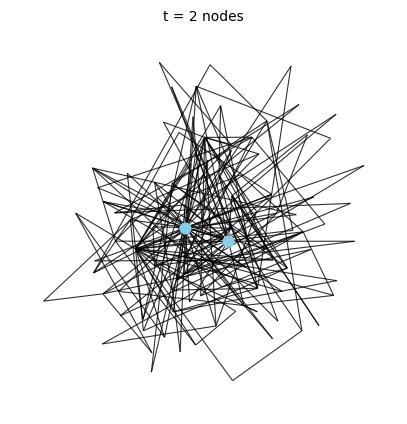

In [82]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

n = 100   # total nodes
m = 2     # edges per new node

# Precompute stable positions for the final graph
pos = nx.spring_layout(nx.barabasi_albert_graph(n, m), seed=42)

# Start with a single edge (2 nodes)
G = nx.Graph()
G.add_edge(0, 1)

fig, ax = plt.subplots(figsize=(5, 5))
ax.set_axis_off()

def draw_current(ax, G, new_n):
    ax.clear()
    ax.set_axis_off()
    nx.draw_networkx_nodes(G, pos, nodelist=range(new_n),
                           node_size=60, node_color="skyblue", ax=ax)
    nx.draw_networkx_edges(G, pos, edgelist=G.edges(), width=0.8, alpha=0.8, ax=ax)
    ax.set_title(f"t = {new_n} nodes", fontsize=10)

def update(frame):
    # frame: 0,1,2,... → new_n = 2+frame
    new_n = 2 + frame
    # Only rebuild using BA once allowed (n >= m+1)
    if new_n >= m + 1:
        G_new = nx.barabasi_albert_graph(new_n, m, seed=42)
        G.clear()
        G.add_edges_from(G_new.edges())
    # For new_n < m+1, we just keep the initial edge
    draw_current(ax, G, new_n)
    return []

ani = animation.FuncAnimation(fig, update, frames=n - 2, interval=150, blit=False)

# Show inline (robust in Jupyter/Colab)
HTML(ani.to_jshtml())